In [11]:
# Check if GPU is enabled
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

1.13.1



Understand dataset structure and files
The dataset being used is Food 101

This dataset has 101000 images in total. It's a food dataset with 101 categories(multiclass)
Each type of food has 750 training samples and 250 test samples
*Note found on the webpage of the dataset : *
On purpose, the training images were not cleaned, and thus still contain some amount of noise. This comes mostly in the form of intense colors and sometimes wrong labels. All images were rescaled to have a maximum side length of 512 pixels.*
The entire dataset is 5GB in size

In [12]:
import os
os.listdir('food-101/images')[:]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [13]:
os.listdir('food-101/meta')

['classes.txt',
 'labels.txt',
 'test.json',
 'test.txt',
 'train.json',
 'train.txt']

Visualize random image from each of the 101 classes

In [14]:
import matplotlib.pyplot as plt
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
import os

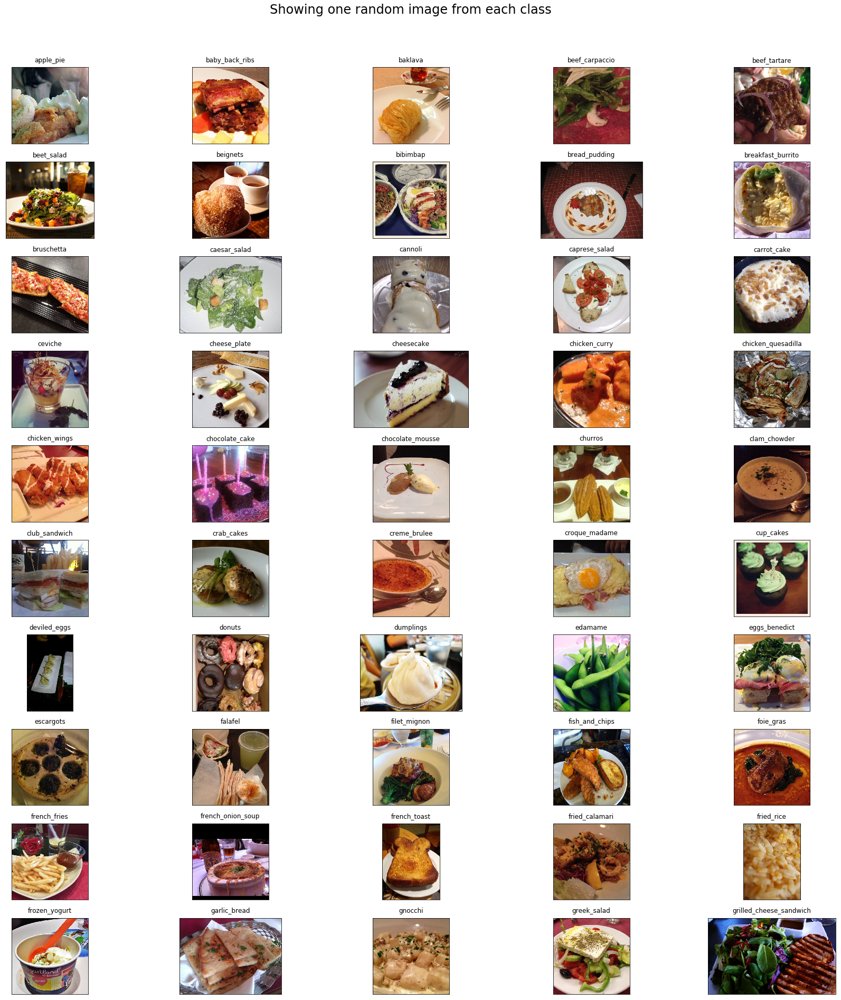

In [15]:
# Visualize the data, showing one image per class from 101 classes
# 상위 50개만 사용 5x10
rows = 10
cols = 5
fig, ax = plt.subplots(rows, cols, figsize=(25,25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
data_dir = "food-101/images/"
foods_sorted = sorted(os.listdir(data_dir))

# 상위 50개의 클래스만 사용할 때, 
foods_sorted = foods_sorted[:50]

food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id] 
      food_id += 1
    except:
      break
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected)) # returns the list of all files present in each food category
    food_selected_random = np.random.choice(food_selected_images) # picks one food item from the list as choice, takes a list and returns one random item
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food_selected, pad = 10)
    
plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()
# https://matplotlib.org/users/tight_layout_guide.html

Split the image data into train and test using train.txt and test.txt

In [16]:
# Helper method to split dataset into train and test folders

# foods 클래스 갯수 변수 추가 - number 
from shutil import copy
def prepare_data(filepath, src, dest, number):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')
        
  count = 0
  for food in classes_images.keys():
    print("\nCopying images into ",food)
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))
    
    count += 1
    if count == number:
        break
  print("Copying Done!")

In [11]:
# Prepare train dataset by copying images from food-101/images to food-101/train using the file train.txt
print("Creating train data...")
prepare_data('food-101/meta/train.txt', 'food-101/images', 'food-101/train', 50)

Creating train data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying im

약 50분 소요

In [12]:
# Prepare test data by copying images from food-101/images to food-101/test using the file test.txt
print("Creating test data...")
prepare_data('food-101/meta/test.txt', 'food-101/images', 'food-101/test', 50)

Creating test data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying ima

약 17분 소요

Create a subset of data with few classes(3) - train_mini and test_mini for experimenting

In [17]:
# List of all 50 types of foods(sorted alphabetically)
print(foods_sorted)
print("len(foods_sorted): ", len(foods_sorted))

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich']
len(foods_sorted):  50


In [21]:
# Helper method to create train_mini and test_mini data samples
# mini train, test 파일 만들기
from shutil import copytree, rmtree
def dataset_mini(food_list, src, dest):
  if os.path.exists(dest):
    rmtree(dest) # removing dataset_mini(if it already exists) folders so that we will have only the classes that we want
  os.makedirs(dest)
  for food_item in food_list :
    print("Copying images into",food_item)
    copytree(os.path.join(src,food_item), os.path.join(dest,food_item))

In [104]:
# mini file 생성을 위한
food_list = ['bibimbap', 'eggs_benedict', 'grilled_cheese_sandwich']
src_train = 'food-101/train'
dest_train = 'food-101/train_mini'
src_test = 'food-101/test'
dest_test = 'food-101/test_mini'

In [44]:
print("Creating train data folder with new classes")
dataset_mini(food_list, src_train, dest_train)

Creating train data folder with new classes
Copying images into bibimbap
Copying images into eggs_benedict
Copying images into grilled_cheese_sandwich


In [45]:
print("Creating test data folder with new classes")
dataset_mini(food_list, src_test, dest_test)

Creating test data folder with new classes
Copying images into bibimbap
Copying images into eggs_benedict
Copying images into grilled_cheese_sandwich


Fine tune Inception Pretrained model using Food 101 dataset

In [46]:
# 갯수 파악 'food-101/train', 'food-101/test'
train_file_count = sum(len(files) for _, _, files in os.walk(r'food-101/train_mini'))  # 'food-101/train'
print("train_file_count: ", train_file_count)

test_file_count = sum(len(files) for _, _, files in os.walk(r'food-101/test_mini'))  # 'food-101/test'
print("test_file_count: ", test_file_count)

train_file_count:  2250
test_file_count:  750


In [47]:
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow import keras
import numpy as np

In [110]:
# Inceptionv3 model을 활용한 3 food classes pretrained
n = 3
K.clear_session()
import time
startTime = time.time()

n_classes = n  # class 갯수 조절 testset일 때, 
img_width, img_height = 299, 299
train_data_dir = 'food-101/train_mini'
validation_data_dir = 'food-101/test_mini'
nb_train_samples = train_file_count  #test:2250, 50개:37500, total:75750  per:750
nb_validation_samples = test_file_count  #test:750, 50개:12500, total:25250  per:250
batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')
validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

inception = InceptionV3(weights='imagenet', include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)
predictions = Dense(n ,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)  # Dense 변수 변경 = class 갯수

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='best_model_3class.hdf5', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_3class.log')


history = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=3, # 1 epoch 당 약 3시간 소요
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])
model.save('model_trained_3class.hdf5')
endTime = time.time() - startTime
print(endTime)

Found 2250 images belonging to 3 classes.
Found 750 images belonging to 3 classes.
Epoch 1/6
140/141 [============================>.] - ETA: 1:25 - loss: 0.9721 - acc: 0.5833

KeyboardInterrupt: 

In [49]:
class_map_3 = train_generator.class_indices
class_map_3

{'bibimbap': 0, 'eggs_benedict': 1, 'grilled_cheese_sandwich': 2}

In [50]:
import matplotlib.pyplot as plt
def plot_accuracy(history, title):
    plt.title(title)
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train_accuracy', 'validation_accuracy'], loc='best')
    plt.show()
def plot_loss(history,title):
    plt.title(title)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'validation_loss'], loc='best')
    plt.show()


plot_accuracy(history,'FOOD101-Inceptionv3')
plot_loss(history,'FOOD101-Inceptionv3')

NameError: name 'history' is not defined

The plots show that the accuracy of the model increased with epochs and the loss has decreased
Validation accuracy has been on the higher side than training accuracy for many epochs
This could be for several reasons:
We used a pretrained model trained on ImageNet which contains data from a variety of classes
Using dropout can lead to a higher validation accuracy
The best model saved has a Top-1 validation accuracy of 93%

# Predicting classes for new images from internet using the best trained model
### 웹 크롤링을 통해 얻은 이미지를 활용하여 학습된 모델을 활용하여 예측해보기

In [51]:
# Loading the best saved model to make predictions
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model

K.clear_session()
model_best = load_model('best_model_3class.hdf5', compile = False)

In [105]:
food_list

['bibimbap', 'eggs_benedict', 'grilled_cheese_sandwich']

Setting compile=False and clearing the session leads to faster loading of the saved model
Withouth the above addiitons, model loading was taking more than a minute!

In [107]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os

def predict_class(model, images, show = True):
  for img in images:
    img = image.load_img(img, target_size=(299, 299))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255.                                      

    pred = model.predict(img)
    index = np.argmax(pred)  # index가 argmax이기 때문에 학습시킨 food classes내에서 prediction
    food_list.sort()
    pred_value = food_list[index]
    if show:
        plt.imshow(img[0])                           
        plt.axis('off')
        plt.title(pred_value)
        plt.show()

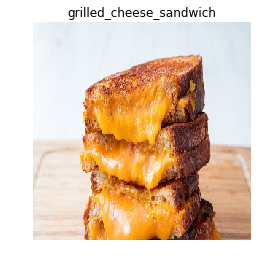

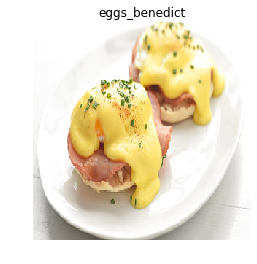

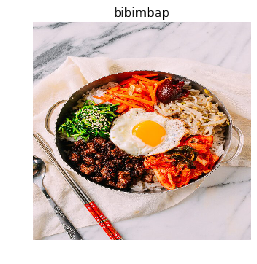

In [106]:
# Make a list of downloaded images and test the trained model
images = []
images.append('food-101/test_image/grilled-cheese-sandwich.jpg')
images.append('food-101/test_image/eggs-benedict.jpg')
images.append('food-101/test_image/bibimbap.jpg')
predict_class(model_best, images, True)

학습을 많이 시키진 않았지만, 모두 성공했다.

# Fine tune Inceptionv3 model with 11 classes of data

We trained a model on 3 classes and tested it using new data
** The model was able to predict the classes of all three test images correctly**
Will it be able to perform at the same level of accuracy for more classes?
FOOD-101 dataset has 101 classes of data
** Even with fine tuning using a pre-trained model, each epoch was taking more than an hour when all 101 classes of data is used(tried this on both Colab and on a Deep Learning VM instance with P100 GPU on GCP)**
But to check how the model performs when more classes are included, I'm using the same model to fine tune and train on 11 randomly chosen classes

In [55]:
import random
def pick_n_random_classes(n):
  food_list = []
  random_food_indices = random.sample(range(len(foods_sorted)),n) # We are picking n random food classes
  for i in random_food_indices:
    food_list.append(foods_sorted[i])
  food_list.sort()
  print("These are the randomly picked food classes we will be training the model on...\n", food_list)
  return food_list

In [35]:
# Lets try with more classes than just 3. Also, this time lets randomly pick the food classes
n = 11
food_list = pick_n_random_classes(11)

These are the randomly picked food classes we will be training the model on...
 ['apple_pie', 'baby_back_ribs', 'bread_pudding', 'chicken_curry', 'chicken_quesadilla', 'chocolate_cake', 'donuts', 'eggs_benedict', 'garlic_bread', 'gnocchi', 'grilled_cheese_sandwich']


In [36]:
# Create the new data subset of n classes
print("Creating training data folder with new classes...")
dataset_mini(food_list, src_train, dest_train)

Creating training data folder with new classes...
Copying images into apple_pie
Copying images into baby_back_ribs
Copying images into bread_pudding
Copying images into chicken_curry
Copying images into chicken_quesadilla
Copying images into chocolate_cake
Copying images into donuts
Copying images into eggs_benedict
Copying images into garlic_bread
Copying images into gnocchi
Copying images into grilled_cheese_sandwich


In [37]:
print("Creating test data folder with new classes")
dataset_mini(food_list, src_test, dest_test)

Creating test data folder with new classes
Copying images into apple_pie
Copying images into baby_back_ribs
Copying images into bread_pudding
Copying images into chicken_curry
Copying images into chicken_quesadilla
Copying images into chocolate_cake
Copying images into donuts
Copying images into eggs_benedict
Copying images into garlic_bread
Copying images into gnocchi
Copying images into grilled_cheese_sandwich


In [38]:
# 갯수 파악 'food-101/train', 'food-101/test'
print("Total number of samples in train folder")
train_file_count = sum(len(files) for _, _, files in os.walk(r'food-101/train_mini'))
print(train_file_count)

print("Total number of samples in test folder")
test_file_count = sum(len(files) for _, _, files in os.walk(r'food-101/test_mini'))
print(test_file_count)

Total number of samples in train folder
8250
Total number of samples in test folder
2750


In [ ]:
# Let's use a pretrained Inceptionv3 model on subset of data with 11 food classes
n = 11

# 시간 측정
import time
startTime = time.time()
endTime = time.time() - startTime
print(endTime)
K.clear_session()

n_classes = n  # 11
img_width, img_height = 299, 299
train_data_dir = 'food-101/train_mini'
validation_data_dir = 'food-101/test_mini'
nb_train_samples = train_file_count  # 8250 
nb_validation_samples = test_file_count  # 2750
batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')


inception = InceptionV3(weights='imagenet', include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(n, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)  # 11

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='best_model_11class.hdf5', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_11class.log')

history_11class = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=10,   # 적어도 15 - 30정도 하는 것이 좋은 결과.
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

model.save('model_trained_11class.hdf5')

endTime = time.time() - startTime
print(endTime)

# batch=16 일 때, 1 epoch에 대략 15시간 정도 걸릴 듯

Found 8250 images belonging to 11 classes.
Found 2750 images belonging to 11 classes.


In [52]:
plot_accuracy(history_11class,'FOOD101-Inceptionv3')
plot_loss(history_11class,'FOOD101-Inceptionv3')

NameError: name 'history_11class' is not defined

The plots show that the accuracy of the model increased with epochs and the loss has decreased
Validation accuracy has been on the higher side than training accuracy for many epochs
This could be for several reasons:
We used a pretrained model trained on ImageNet which contains data from a variety of classes
Using dropout can lead to a higher validation accuracy
I set number of epochs to just 10, as each epoch's taking around 6mins
loss is still decreasing, so the model can have some more epochs
Increase the number of epochs for better accuracy

In [ ]:
# Loading the best saved model to make predictions
from tensorflow.keras.models import load_model
K.clear_session()
model_best = load_model('best_model_11class.hdf5',compile = False)

In [ ]:
# Make a list of downloaded images and test the trained model
images = []
images.append('food-101/test_image/apple_pie.jpg')
images.append('food-101/test_image/baby_back_ribs')
images.append('food-101/test_image/bread_pudding')
images.append('food-101/test_image/chicken_curry')
predict_class(model_best, images, True)

The model did well even when the number of classes are increased to 11
Model training on all 101 classes takes some time
** It was taking more than an hour for one epoch when the full dataset is used for fine tuning**

# 추가
Using feature visualization, we can know what a neural network layer and its features are looking for
Using attribution, we can understand how the features impact the output and what regions in the image led the model to the generated output

# Let us now check the model we trained and understand how it sees and classifies

In [56]:
# Load the saved model trained with 3 classes
# 3 클래스로 한 모델이 학습이 가장 많이 되어서 예시를 위해 사용
K.clear_session()
print("Loading the model..")
model = load_model('best_model_3class.hdf5',compile = False)
print("Done!")

Loading the model..
Done!


Summary of the model gives us the list of all the layers in the network along with other useful details

In [57]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_v1 (BatchNo (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization_v1[0][0]     
__________________________________________________________________________________________________
conv2d_1 (

batch_normalization_v1_91 (Batc (None, None, None, 3 1152        conv2d_91[0][0]                  
__________________________________________________________________________________________________
batch_normalization_v1_92 (Batc (None, None, None, 3 1152        conv2d_92[0][0]                  
__________________________________________________________________________________________________
conv2d_93 (Conv2D)              (None, None, None, 1 393216      average_pooling2d_8[0][0]        
__________________________________________________________________________________________________
batch_normalization_v1_85 (Batc (None, None, None, 3 960         conv2d_85[0][0]                  
__________________________________________________________________________________________________
activation_87 (Activation)      (None, None, None, 3 0           batch_normalization_v1_87[0][0]  
__________________________________________________________________________________________________
activation

In [58]:
# Defining some helper functions
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [59]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

In [60]:
def get_activations(img, model_activations):
    img = image.load_img(img, target_size=(299, 299))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255
    plt.imshow(img[0])
    plt.show()
    return model_activations.predict(img)

In [61]:
def show_activations(activations, layer_names):
    
    images_per_row = 16

    # Now let's display our feature maps
    for layer_name, layer_activation in zip(layer_names, activations):
        # This is the number of features in the feature map
        n_features = layer_activation.shape[-1]

        # The feature map has shape (1, size, size, n_features)
        size = layer_activation.shape[1]

        # We will tile the activation channels in this matrix
        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))

        # We'll tile each filter into this big horizontal grid
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,
                                                 :, :,
                                                 col * images_per_row + row]
                # Post-process the feature to make it visually palatable
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                             row * size : (row + 1) * size] = channel_image

        # Display the grid
        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')

    plt.show()

Check how many layers are in the trained model(this includes the 1st input layer as well)

In [62]:
len(model.layers)

315

Can we visualize the outputs of all the layers?
Yes, we can. But that gets too tedious
So, let's choose a few layers to visualize

In [64]:
# We start with index 1 instead of 0, as input layer is at index 0
from tensorflow.keras import models
layers = [layer.output for layer in model.layers[1:11]]
# We now initialize a model which takes an input and outputs the above chosen layers
activations_output = models.Model(inputs=model.input, outputs=layers)

As seen below, the 10 chosen layers contain 3 convolution, 3 batch normalization, 3 activation and 1 max pooling layers

In [65]:
layers

[<tf.Tensor 'conv2d/Conv2D:0' shape=(?, ?, ?, 32) dtype=float32>,
 <tf.Tensor 'batch_normalization_v1/cond/Merge:0' shape=(?, ?, ?, 32) dtype=float32>,
 <tf.Tensor 'activation/Relu:0' shape=(?, ?, ?, 32) dtype=float32>,
 <tf.Tensor 'conv2d_1/Conv2D:0' shape=(?, ?, ?, 32) dtype=float32>,
 <tf.Tensor 'batch_normalization_v1_1/cond/Merge:0' shape=(?, ?, ?, 32) dtype=float32>,
 <tf.Tensor 'activation_1/Relu:0' shape=(?, ?, ?, 32) dtype=float32>,
 <tf.Tensor 'conv2d_2/Conv2D:0' shape=(?, ?, ?, 64) dtype=float32>,
 <tf.Tensor 'batch_normalization_v1_2/cond/Merge:0' shape=(?, ?, ?, 64) dtype=float32>,
 <tf.Tensor 'activation_2/Relu:0' shape=(?, ?, ?, 64) dtype=float32>,
 <tf.Tensor 'max_pooling2d/MaxPool:0' shape=(?, ?, ?, 64) dtype=float32>]

In [108]:
# Get the names of all the selected layers
layer_names = []
for layer in model.layers[1:11]:   # 추후 다른 알고리즘으로 시도
    layer_names.append(layer.name)
print(layer_names)

['conv2d', 'batch_normalization_v1', 'activation', 'conv2d_1', 'batch_normalization_v1_1', 'activation_1', 'conv2d_2', 'batch_normalization_v1_2', 'activation_2', 'max_pooling2d']


Provide an input to the model and get the activations of all the 10 chosen layers

In [ ]:
food = 'food-101/test_image/bibimbap.jpg'
activations = get_activations(food, activations_output)

activations contain the outputs of all the 10 layers which can be plotted and visualized

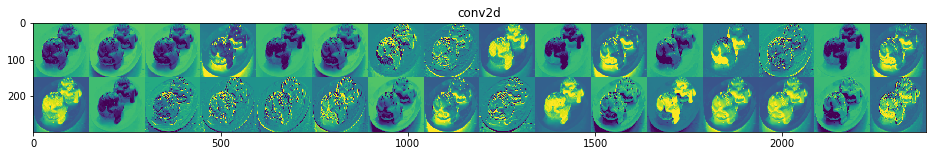

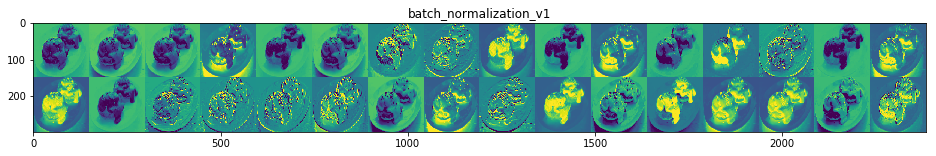

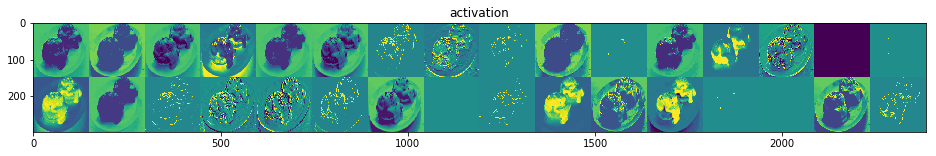

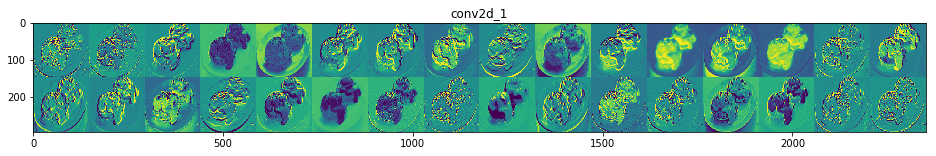

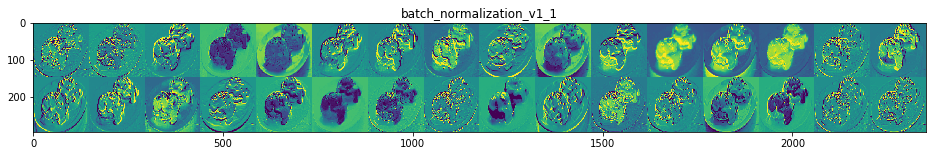

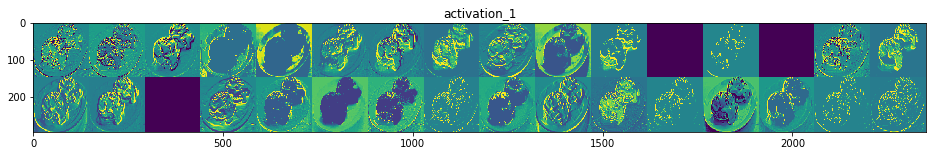

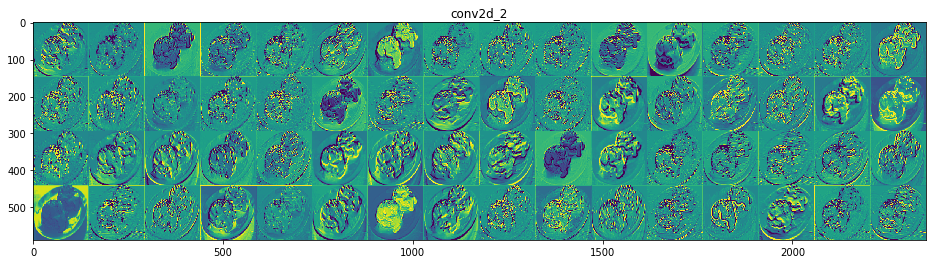

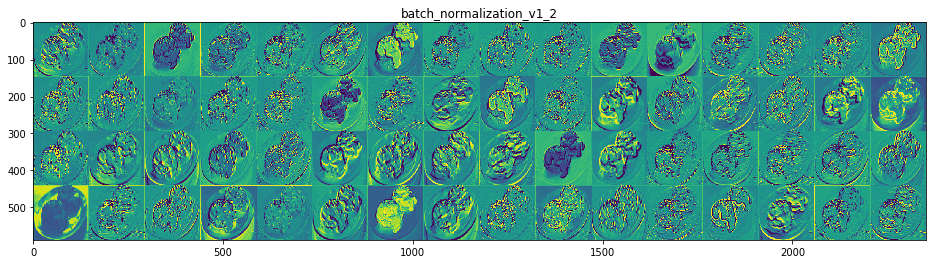

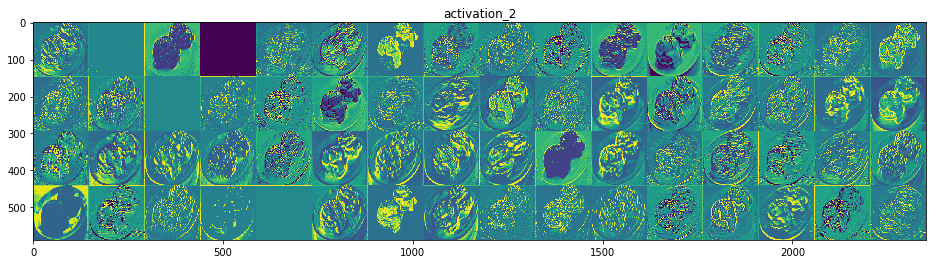

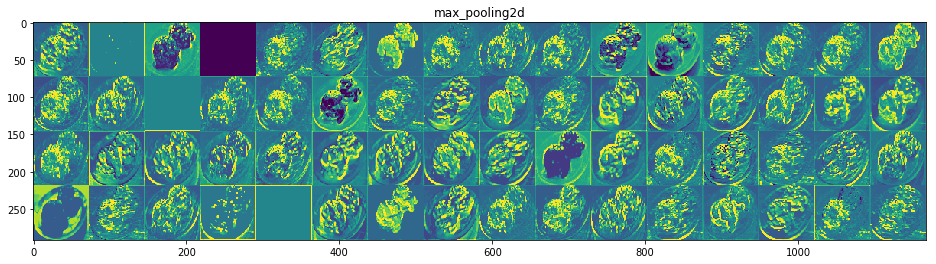

In [71]:
show_activations(activations, layer_names)

What we see in the above plots are the activations or the outputs of each of the 11 layers we chose
The activations or the outputs from the 1st layer(conv2d_1) don't lose much information of the original input
They are the results of applying several edge detecting filters on the input image
With each added layer, the activations lose visual/input information and keeps building on the class/ouput information
As the depth increases, the layers activations become less visually interpretabale and more abstract
By doing so, they learn to detect more specific features of the class rather than just edges and curves
We plotted just 10 out of 314 intermediate layers. We already have in these few layers, activations which are blank/sparse(for ex: the 2 blank activations in the layer activation_1)
These blank/sparse activations are caused when any of the filters used in that layer didn't find a matching pattern in the input given to it
By plotting more layers(specially those towards the end of the network), we can observe more of these sparse activations and how the layers get more abstract

Get the activations for a different input / food

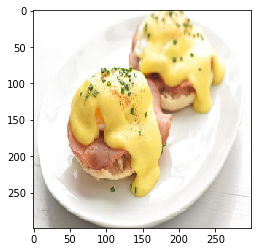

In [69]:
food = 'food-101/test_image/eggs-benedict.jpg'
activations = get_activations(food,activations_output)

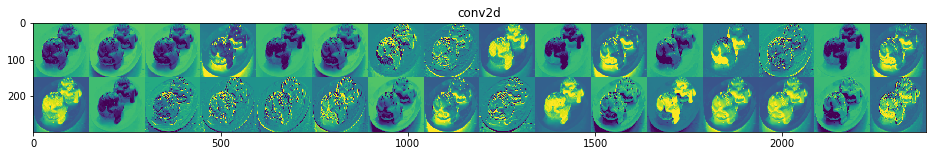

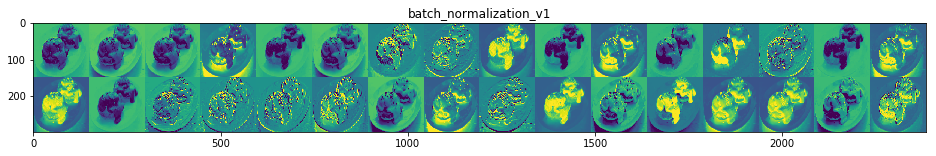

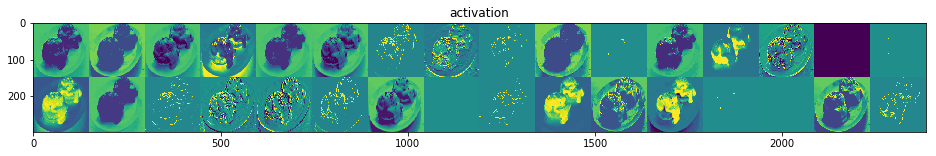

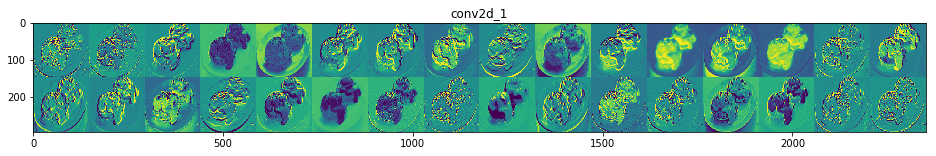

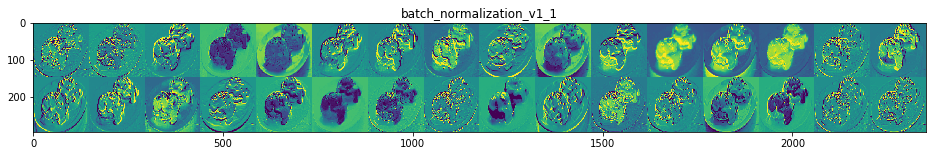

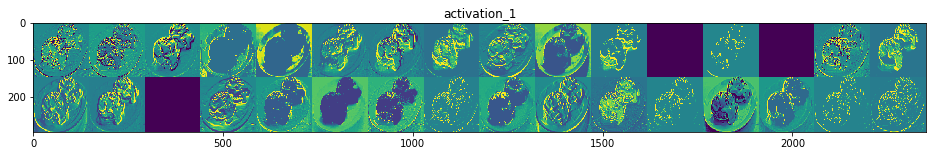

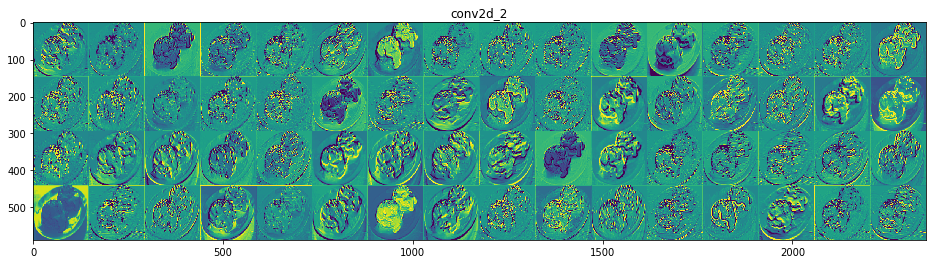

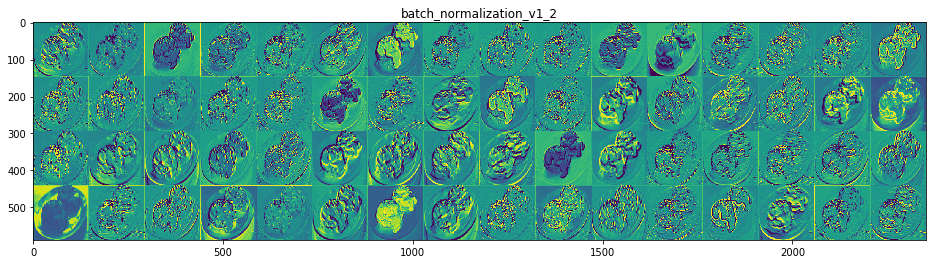

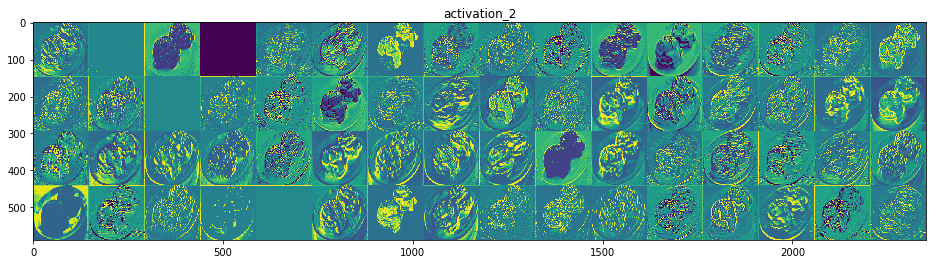

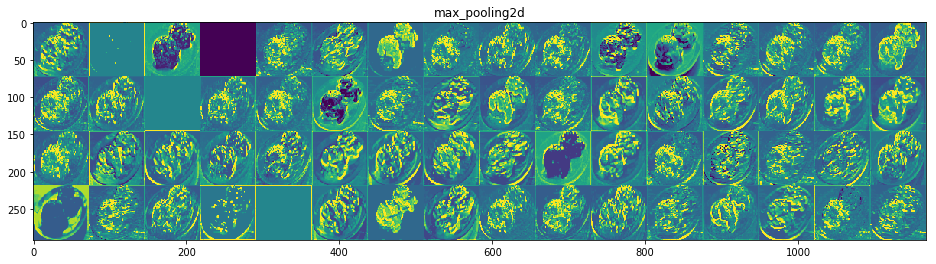

In [72]:
show_activations(activations, layer_names)

The feature maps in the above activations are for a different input image
We see the same patterns discussed for the previous input image
It is interesting to see the blank/sparse activations in the same layer(activation_1) and for same filters when a different image is passed to the network
Remember we used a pretrained Inceptionv3 model. All the filters that are used in different layers come from this pretrained model

# Look into the sparse activations in the layer activation_1

In [73]:
layer_names

['conv2d',
 'batch_normalization_v1',
 'activation',
 'conv2d_1',
 'batch_normalization_v1_1',
 'activation_1',
 'conv2d_2',
 'batch_normalization_v1_2',
 'activation_2',
 'max_pooling2d']

We have two blank/sparse activations in layer 6
Below cell displays one of the sparse activations

In [74]:
# Get the index of activation_1 layer which has sparse activations
ind = layer_names.index('activation_1')
sparse_activation = activations[ind]
a = sparse_activation[0, :, :, 13]
a

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)

In [75]:
all (np.isnan(a[j][k])  for j in range(a.shape[0]) for k in range(a.shape[1]))

True

We can see that the activation has all nan values(it was all zeros when executed outside Kaggle, Im yet to figure out why its showing all nan values here
To know why we have all zero/nan values for this activation, lets visualize the activation at same index 13 from previous layer

In [78]:
# Get the index of batch_normalization_1 layer which has sparse activations
ind = layer_names.index('batch_normalization_v1_1')
sparse_activation = activations[ind]
b = sparse_activation[0, :, :, 13]
b

array([[77.25354 , 77.25354 , 77.25354 , ..., 77.25354 , 77.25354 ,
        77.25354 ],
       [77.25354 , 77.25354 , 77.25354 , ..., 77.25354 , 77.25354 ,
        77.25354 ],
       [77.25354 , 77.25354 , 77.25354 , ..., 77.25354 , 77.25354 ,
        77.25354 ],
       ...,
       [73.993546, 70.73355 , 70.73355 , ..., 77.25354 , 77.25354 ,
        77.25354 ],
       [67.47356 , 64.21356 , 60.953568, ..., 73.993546, 73.993546,
        73.993546],
       [64.21356 , 67.47356 , 67.47356 , ..., 77.25354 , 73.993546,
        77.25354 ]], dtype=float32)

All the values in the above activation map from the layer batch_normalization_1 are negative
This activation in batch_normalization_1 is passed to the next layer activation_1 as input
As the name says, activation_1 is an activation layer and ReLu is the activation function used
ReLu takes an input value, returns 0 if its negative, the value otherwise
Since the input to activation array contains all negative values, the activation layer fills its activation map with all zeros for the index
Now we know why we have those 2 sparse activations in activation_1 layer

# Show the activation outputs of 1st, 2nd and 3rd Conv2D layer activations to compare how layers get abstract with depth

Text(0.5, 1.0, 'Conv2d_3')

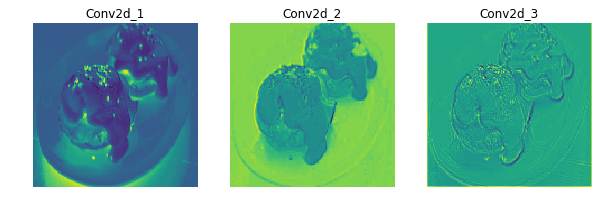

In [79]:
first_convlayer_activation = activations[0]
second_convlayer_activation = activations[3]
third_convlayer_activation = activations[6]
f,ax = plt.subplots(1,3, figsize=(10,10))
ax[0].imshow(first_convlayer_activation[0, :, :, 3], cmap='viridis')
ax[0].axis('OFF')
ax[0].set_title('Conv2d_1')
ax[1].imshow(second_convlayer_activation[0, :, :, 3], cmap='viridis')
ax[1].axis('OFF')
ax[1].set_title('Conv2d_2')
ax[2].imshow(third_convlayer_activation[0, :, :, 3], cmap='viridis')
ax[2].axis('OFF')
ax[2].set_title('Conv2d_3')

# Attribution

So far we were doing activation maps visualization
This helps in understanding how the input is transformed from one layer to another as it goes through several operations
At the end of training, we want the model to classify or detect objects based on features which are specific to the class
For example, when training a dogs vs cats classifier, the model should detect dogs based on features relevant to dog but not cats
To validate how model attributes the features to class output, we can generate heat maps using gradients to find out which regions in the input images were instrumental in determining the class

In [80]:
def get_attribution(food):
    img = image.load_img(food, target_size=(299, 299))
    img = image.img_to_array(img) 
    img /= 255. 
    f,ax = plt.subplots(1,3, figsize=(15,15))
    ax[0].imshow(img)
    
    img = np.expand_dims(img, axis=0) 
    
    preds = model.predict(img)
    class_id = np.argmax(preds[0])
    ax[0].set_title("Input Image")
    class_output = model.output[:, class_id]
    last_conv_layer = model.get_layer("mixed10")
    
    grads = K.gradients(class_output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
    pooled_grads_value, conv_layer_output_value = iterate([img])
    for i in range(2048):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    ax[1].imshow(heatmap)
    ax[1].set_title("Heat map")
    
    
    act_img = cv2.imread(food)
    heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
    cv2.imwrite('classactivation.png', superimposed)
    img_act = image.load_img('classactivation.png', target_size=(299, 299))
    ax[2].imshow(img_act)
    ax[2].set_title("Class Activation")
    plt.show()
    return preds

In [81]:
print("Showing the class map..")
print(class_map_3)

Showing the class map..
{'bibimbap': 0, 'eggs_benedict': 1, 'grilled_cheese_sandwich': 2}


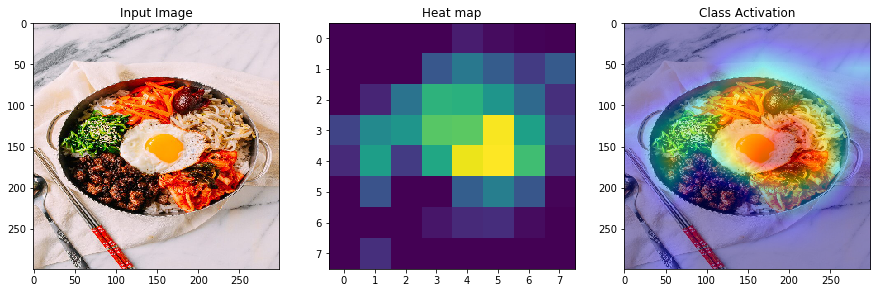

Here are softmax predictions.. [[0.6392082  0.04961831 0.31117347]]


In [83]:
import cv2
pred = get_attribution('food-101/test_image/bibimbap.jpg')
print("Here are softmax predictions..",pred)

In the above plot, we see on left the input image passed to the model, heat map in the middle and the class activation map on right
Heat map gives a visual of what regions in the image were used in determining the class of the image
Now it's clearly visible what a model looks for in an image if it has to be classified as an applepie!

See how the class activation map looks for a different image

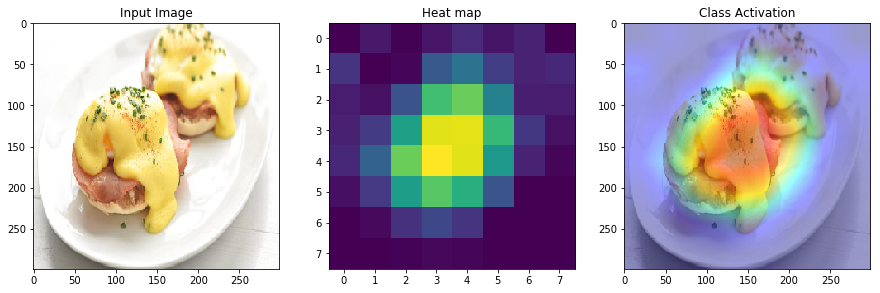

Here are softmax predictions.. [[0.01472849 0.96348065 0.02179079]]


In [84]:
pred = get_attribution('food-101/test_image/eggs-benedict.jpg')
print("Here are softmax predictions..",pred)

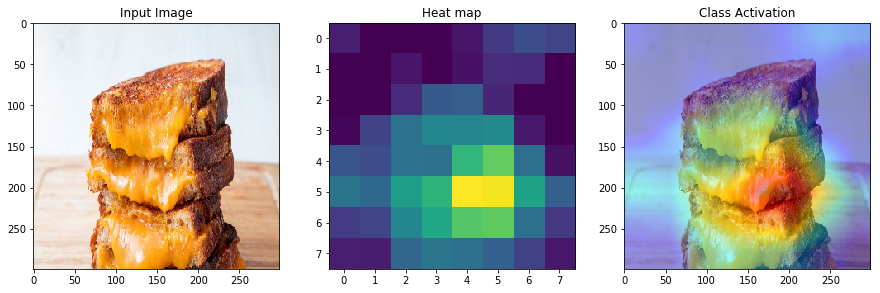

Here are softmax predictions.. [[0.0608012  0.09768793 0.8415109 ]]


In [86]:
pred = get_attribution('food-101/test_image/grilled-cheese-sandwich.jpg')
print("Here are softmax predictions..",pred)

We can see how the heat map is different for a different image i.e the model looks for a totally different features/regions if it has to classify it as a pizza

# Lets see if we can break the model or see what it does when we surpise it with different data!
We trained our model to perform multi class classification and it seems to be doing well with >95% of accuracy
What will the model do when we give it an image which has more than one object that model is trained to classify?

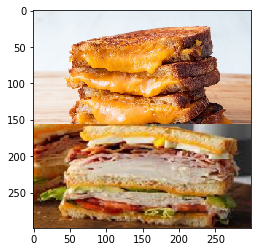

In [87]:
food = 'food-101/test_image/two-sandwich-1.jpg'
activations = get_activations(food,activations_output)

C:\Users\Jongil Park\AppData\Local\conda\conda\envs\python_study\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide


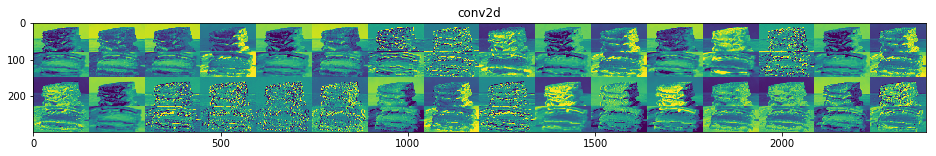

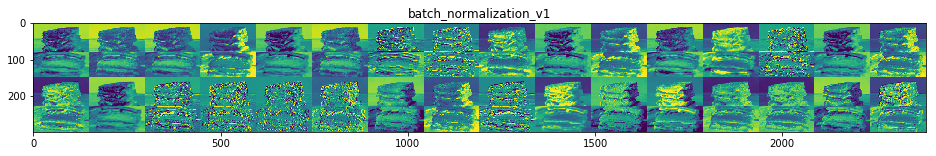

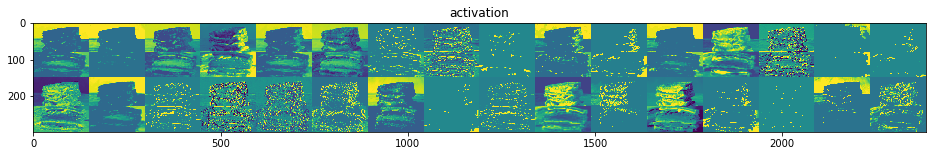

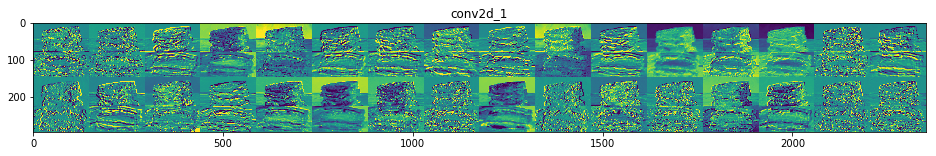

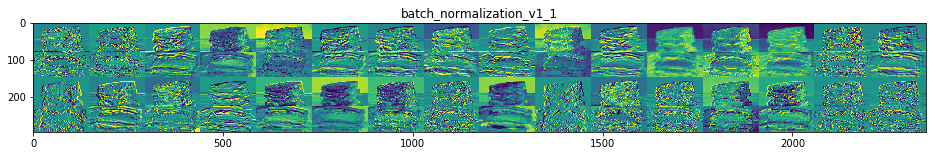

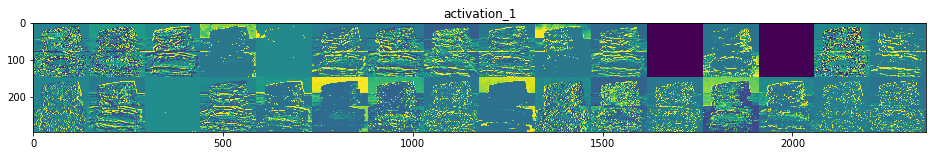

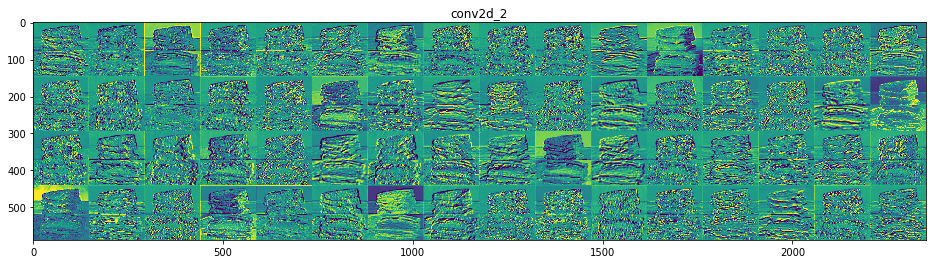

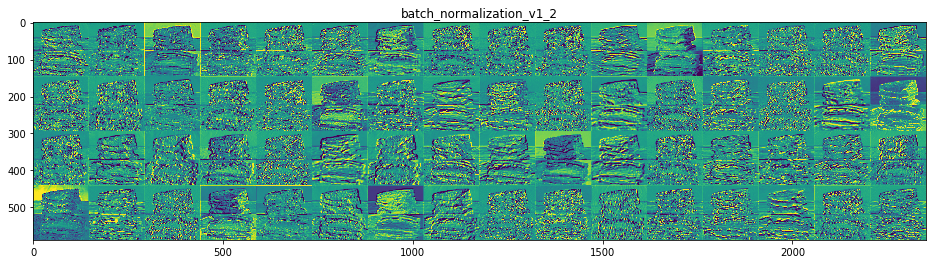

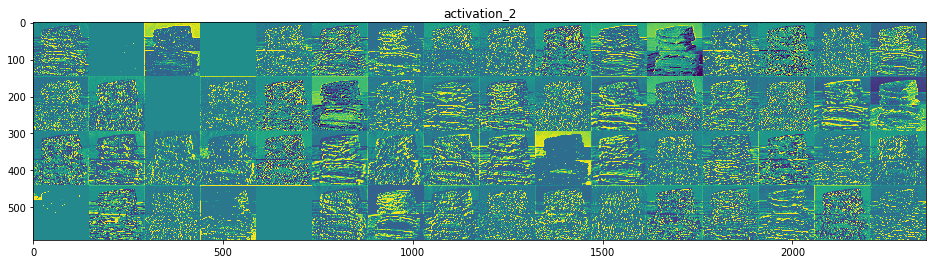

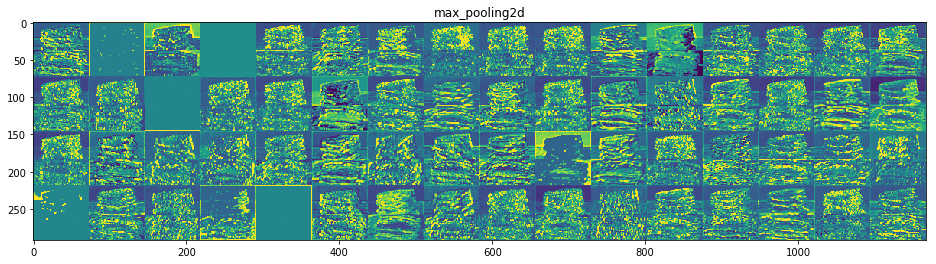

In [89]:
show_activations(activations, layer_names)

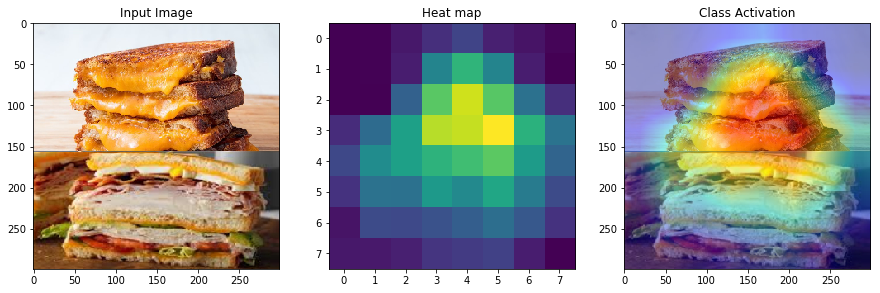

Here are softmax predictions.. [[0.09171534 0.06298628 0.84529835]]


In [109]:
pred = get_attribution('food-101/test_image/two-sandwich-1.jpg')
print("Here are softmax predictions..",pred)

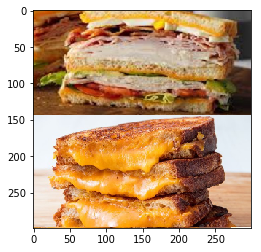

In [92]:
food = 'food-101/test_image/two-sandwich-2.jpg'
activations = get_activations(food,activations_output)

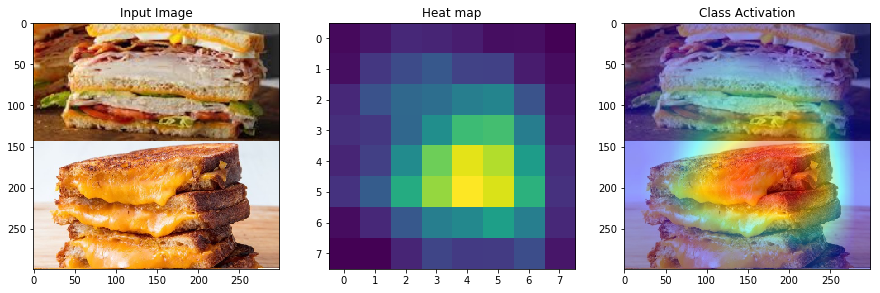

Here are softmax predictions.. [[0.02157178 0.03664926 0.94177896]]


In [94]:
pred = get_attribution('food-101/test_image/two-sandwich-2.jpg')
print("Here are softmax predictions..",pred)

Well, the model flipped its output too!
The model now thinks its an apple pie with 49.7% confidence and a pizza with 31.9%

# QUESTION!
But hey, we did not train our model to do multi label classification. So why are we giving it input images with multiple classes?

# ANSWER¶
Once we train a model, it is also necessary to try it in a way we know it may not work(like giving images with multiple classes of objects in it). This will lead to new observations, insights and maybe new conclusions if not inventions!
Flipping the image vertically has flipped the outputs whereas doing a horizontal flip didnt cause any change in output class
As a next step, we can try with more images, from different classes and check if the same pattern exists

# Summary of the things I tried
This notebook is the refactored and organised version of all the experiments and training trials I made
I used this very useful Keras blog - https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html for reference
I spent considerable amount of time in fixing things even before getting to the model training phase
For example, it took some time to get the image visualization plots aligned withouth any overlap
It is easier to go through a notebook and understand code someone else has taken hours to finish
I started with VGG16 pretrained model. It did give good validation accuracy after training for few epochs
I then tried Inceptionv3. VGG was taking more time for each epoch and since inception was also giving good validation accuracy, I chose Inception over VGG
For data augmentation, I sticked to the transformations used in the above blog
I didnt use TTA except rescaling test images
Model explainability helped me understand many new things
Once we train a model, it is also necessary to try it in a way we know it may not work(like giving images with multiple classes of objects in it). This will lead to new observations, insights and maybe new conclusions if not inventions!

# Further Improvements
Try more augmentation on test images
Fine tune the model on the entire dataset(for a few epochs atleast)
Play with hyper parameters, their values and see how it impacts model performance
There is currently no implementation to handle out of distribution / no class scenario. Can try below methods:
Set a threshold for the class with highest score. When model gives prediction score below the threshold for its top prediction, the prediction can be classified as NO-CLASS / UNSEEN
Add a new class called NO-CLASS, provide data from different classes other than those in the original dataset. This way the model also learns how to classify totally unseen/unrelated data
I am yet to try these methods and not sure about the results
Recently published paper - Rethinking ImageNet Pretraining, claims that training from random initialization instead of using pretrained weights is not only robust but also gives comparable results
Pre-trained models are surely helpful. They save a lot of time and computation. Yet, that shouldn't be the reason to not try to train a model from scratch
Time taking yet productive experiment would be to try and train a model on this dataset from scratch
Do more experiments with Model Interpretability and see what can be observed

# References
Deep Learning with Python by Francois Cholett - must read really!
Building Powerful Image Classification Models
How Convolutional Neural Networks See the World
The Building Blocks of Interpretability
Feature Visualization